## Импорт необходимых библиотек

In [1]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import re

## Для полноты картины делаем так, чтобы показывались все строки датафрейма

In [2]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [3]:
articles_df = pd.read_json('../data/articles.json')
articles_df

,Уровень сложности,Время на прочтение,Количество просмотров,tags,creator
0,Простой,8 мин,69K,"[Работа с видео, Машинное обучение, Искусствен...",/ru/users/Realife/
1,Простой,30 мин,334K,"[Блог компании Open Data Science, Машинное обу...",/ru/users/stalkermustang/
2,Простой,4 мин,102K,"[Машинное обучение, Управление персоналом]",/ru/users/Odin_Himself/
3,Простой,3 мин,101K,"[Машинное обучение, Искусственный интеллект, М...",/ru/users/aGGre55or/
4,NaN,18 мин,70K,"[Программирование, Сжатие данных, Машинное обу...",/ru/users/3Dvideo/
5,Средний,75 мин,140K,"[Алгоритмы, Машинное обучение, Искусственный и...",/ru/users/TyVik/
6,NaN,13 мин,59K,"[Open source, Big Data, Машинное обучение, Нау...",/ru/users/3Dvideo/
7,Средний,14 мин,107K,"[Блог компании Сбер, Блог компании SberDevices...",/ru/users/averkij/
8,NaN,4 мин,148K,"[Блог компании RUVDS.com, Обработка изображени...",/ru/users/Aleron75/
9,Простой,24 мин,103K,"[Машинное обучение, Искусственный интеллект]",/ru/users/man_of_letters/


In [4]:
non_null_counts = articles_df.count()

non_null_df = pd.DataFrame(non_null_counts, columns=['Non-Null Count'])

sorted_non_null_df = non_null_df.sort_values(by='Non-Null Count', ascending=False)

sorted_non_null_df

,Non-Null Count
Время на прочтение,600
Количество просмотров,600
tags,600
creator,599
Уровень сложности,82


## Связь между прочтением и количеством просмотров

In [5]:
articles_df['Количество просмотров'] = articles_df['Количество просмотров'].str.replace('K', '000').str.replace('M', '00000').str.replace('.', '').astype(int)
articles_df['Время на прочтение'] = articles_df['Время на прочтение'].str.replace('мин', '').str.extract('(\d+)').astype(int)

<>:2: SyntaxWarning: invalid escape sequence '\d'
<>:2: SyntaxWarning: invalid escape sequence '\d'
/var/folders/82/8g_0rbdn4_x9dq7f41hyyzsc0000gn/T/ipykernel_30591/2336520498.py:2: SyntaxWarning: invalid escape sequence '\d'
  articles_df['Время на прочтение'] = articles_df['Время на прочтение'].str.replace('мин', '').str.extract('(\d+)').astype(int)


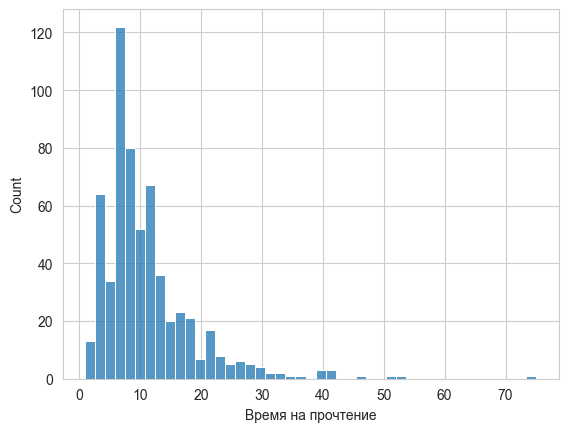

In [6]:
sns.histplot(x=articles_df['Время на прочтение'])

plt.savefig("../visuals/article_time_count.png", format='png', dpi=150)

In [7]:
sorted_df = articles_df.sort_values(by='Количество просмотров', ascending=False)
sorted_df.head()

,Уровень сложности,Время на прочтение,Количество просмотров,tags,creator
446,NaN,7,1500000,[Машинное обучение],/ru/users/Arnis71/
444,NaN,30,500000,"[Блог компании Open Data Science, Python, Алго...",/ru/users/yorko/
276,NaN,33,483000,"[Блог компании Open Data Science, Python, Data...",/ru/users/yorko/
413,NaN,15,407000,"[Блог компании Open Data Science, Python, Data...",/ru/users/miptgirl/
114,NaN,5,368000,"[Обработка изображений, Машинное обучение, Иск...",/ru/users/olzeykan/


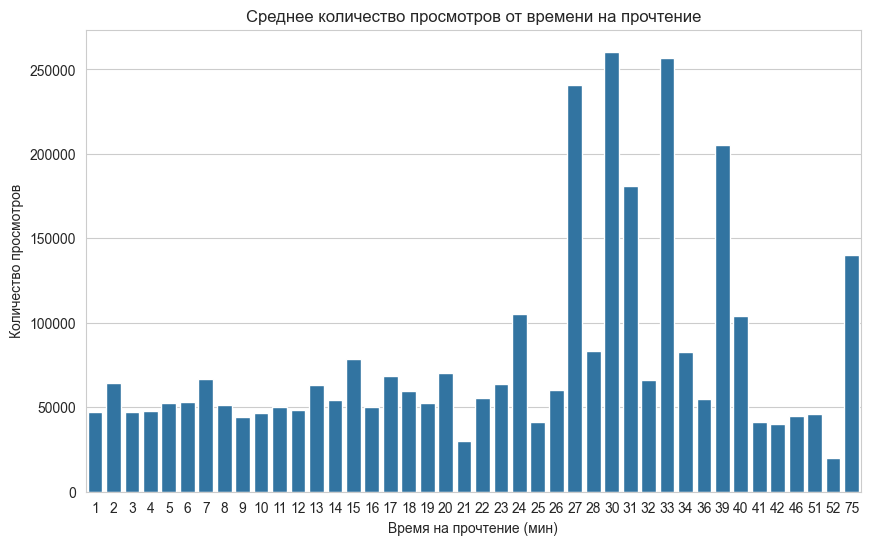

In [8]:
plt.figure(figsize=(10, 6))
sns.barplot(data=articles_df.groupby("Время на прочтение")['Количество просмотров'].mean())
plt.title('Среднее количество просмотров от времени на прочтение')
plt.xlabel('Время на прочтение (мин)')
plt.ylabel('Количество просмотров')

plt.savefig("../visuals/article_time_to_read_hist.png", format='png', dpi=150)

## Связность тэгов

In [9]:
articles_df['tags'] = articles_df['tags'].apply(lambda x: x if isinstance(x, list) else [])

In [10]:
px.bar(articles_df.explode('tags')["tags"].value_counts().head(6))

In [11]:
G = nx.Graph()

for tags in articles_df['tags']:
    for tag1 in tags:
        for tag2 in tags:
            if tag1 != tag2:
                if G.has_edge(tag1, tag2):
                    G[tag1][tag2]['weight'] += 1
                else:
                    G.add_edge(tag1, tag2, weight=1)

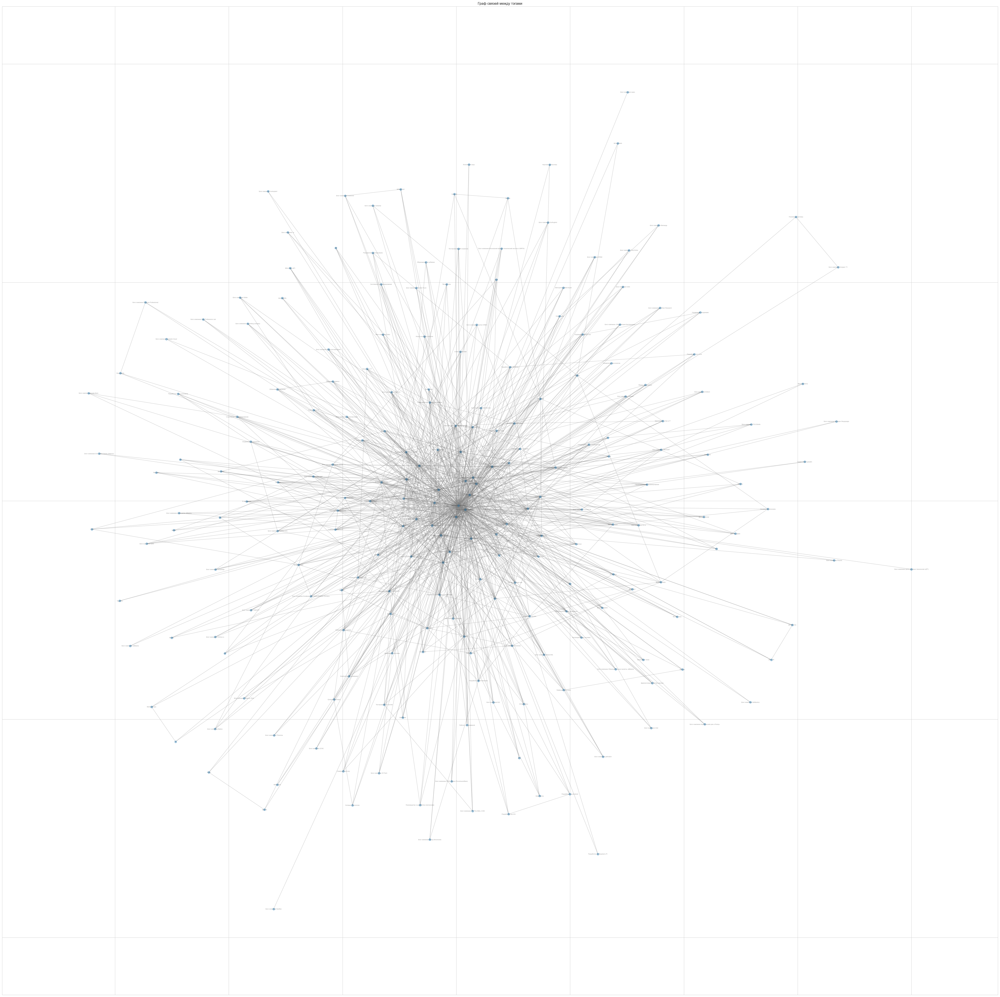

In [12]:
plt.figure(figsize=(60, 60))
pos = nx.spring_layout(G, k=0.15, iterations=20)
nx.draw_networkx(G, pos, node_size=50, edge_color='gray', alpha=0.4, with_labels=True, font_size=5)
plt.title('Граф связей между тэгами')

plt.savefig("../visuals/tag_graph.png", format='png', dpi=1000)

In [13]:
centrality = nx.degree_centrality(G)
sorted_centrality = sorted(centrality.items(), key=lambda x: x[1], reverse=True)[:10]
print("Топ-10 тэгов по центральности:")
for tag, value in sorted_centrality:
    print(f"{tag}: {value}")

Топ-10 тэгов по центральности:
Машинное обучение: 1.0
Искусственный интеллект: 0.5178571428571428
Обработка изображений: 0.33928571428571425
Алгоритмы: 0.2901785714285714
Python: 0.2589285714285714
Программирование: 0.24107142857142855
Big Data: 0.24107142857142855
Блог компании Яндекс: 0.20982142857142855
Data Mining: 0.20535714285714285
Блог компании Open Data Science: 0.19642857142857142


## Пользователи, которые написали наибольшее количество статей

In [14]:
articles_df['tag'] = '@' + articles_df['creator'].astype(str).apply(lambda x: re.search(r"/ru/users/([^/]+)/", x).group(1) if x and '/ru/users/' in x else None)

In [15]:
articles_df

,Уровень сложности,Время на прочтение,Количество просмотров,tags,creator,tag
0,Простой,8,69000,"[Работа с видео, Машинное обучение, Искусствен...",/ru/users/Realife/,@Realife
1,Простой,30,334000,"[Блог компании Open Data Science, Машинное обу...",/ru/users/stalkermustang/,@stalkermustang
2,Простой,4,102000,"[Машинное обучение, Управление персоналом]",/ru/users/Odin_Himself/,@Odin_Himself
3,Простой,3,101000,"[Машинное обучение, Искусственный интеллект, М...",/ru/users/aGGre55or/,@aGGre55or
4,NaN,18,70000,"[Программирование, Сжатие данных, Машинное обу...",/ru/users/3Dvideo/,@3Dvideo
5,Средний,75,140000,"[Алгоритмы, Машинное обучение, Искусственный и...",/ru/users/TyVik/,@TyVik
6,NaN,13,59000,"[Open source, Big Data, Машинное обучение, Нау...",/ru/users/3Dvideo/,@3Dvideo
7,Средний,14,107000,"[Блог компании Сбер, Блог компании SberDevices...",/ru/users/averkij/,@averkij
8,NaN,4,148000,"[Блог компании RUVDS.com, Обработка изображени...",/ru/users/Aleron75/,@Aleron75
9,Простой,24,103000,"[Машинное обучение, Искусственный интеллект]",/ru/users/man_of_letters/,@man_of_letters


1. Извлечь тэги пользователей из статей
2. Посчитать количество статей для каждого пользователя
3. Посмотреть, что это за пользователи

In [16]:
articles_per_user = articles_df['tag'].value_counts()
articles_per_user

tag
@ZlodeiBaal             16
@m1rko                  16
@alizar                 12
@Leono                  11
@BarakAdama             11
@mephistopheies          8
@PatientZero             7
@snakers4                6
@yorko                   6
@averkij                 6
@3Dvideo                 6
@art_pro                 6
@ternaus                 5
@sim0nsays               5
@Syurmakov               5
@Firemoon                5
@arttom                  5
@Doctor_IT               5
@man_of_letters          5
@virtual_explorer        4
@stalkermustang          4
@Laggg                   4
@fantast8                4
@cointegrated            4
@devpony                 4
@Nikuson                 4
@belgraviton             3
@dvorkjoker              3
@vladbalv                3
@boygenius               3
@dairok                  3
@ru_vds                  3
@randall                 3
@ashagraev               3
@ddimitrov               3
@Zalina                  3
@imalion                

In [17]:
users_df = pd.read_json('../data/users.json')
merged_df = pd.merge(articles_per_user, users_df, on='tag', how='left')

In [18]:
merged_df = merged_df.rename(columns = {"count" : "Количество написанных статей"})
merged_df

,tag,Количество написанных статей,karma,rating,В рейтинге,Зарегистрирован,Значки,Откуда,Дата рождения,Состоит в хабах,Подписан на компании,Работает в,О себе,Специализация,Приглашена,Пригласила на сайт
0,@ZlodeiBaal,16,452.0,59.0,85-й,2011-07-25,Захабренный Звезда Комментатор Старожил Техноа...,"Москва, Москва и Московская обл., Россия",1987-10-06,"[Creative Commons, CRM-системы, Delphi, DIY ил...","[JUG Ru Group, Recognitor]",JUG Ru Group\n \n Recognitor,e-mail: maltsevanton@yandex.ru cvml.ru — сайт ...,NaN,NaN,NaN
1,@m1rko,16,1293.0,0.0,Не участвует,2016-12-13,Захабренный Легенда Старожил Переводчик,NaN,NaN,"[*nix, .NET, 1С-Bitrix, 3D printers, Accessibi...","[Дата-центр «Миран», GlobalSign, ITSumma]",NaN,"Качественный контент, корпоративные блоги По в...",NaN,NaN,NaN
2,@alizar,12,1057.0,245.0,17-й,2006-06-11,Захабренный Легенда Старожил Переводчик Карьер...,Кипр,NaN,"[*nix, .NET, 1C, 1С-Bitrix, 3D printers, Acces...","[GlobalSign, RUVDS.com]",RUVDS.com,Качественный контент. По всем вопросам пишите ...,NaN,NaN,NaN
3,@Leono,11,214.0,-4.0,Не участвует,2011-10-10,Захабренный Звезда Старожил Бета-тестер ▇▅▄▅▅▄...,"Москва, Москва и Московская обл., Россия",NaN,"[DIY, IT-companies, Gadgets, Computer hardware...","[Конференции Олега Бунина (Онтико), Яндекс, Ян...",Яндекс\n \n ЮMoney\n \n ...,NaN,NaN,NaN,NaN
4,@BarakAdama,11,188.0,1.5,1 023-й,2013-02-26,Захабренный Легенда Старожил,Россия,NaN,[Habr],"[2ГИС, AvitoTech, Brave, СберЗдоровье, Dodo En...",Яндекс,NaN,NaN,NaN,NaN
5,@mephistopheies,8,139.0,0.0,Не участвует,2007-02-21,Захабренный Автор Старожил,"Калининград (Кенигсберг), Калининградская обл....",1984-05-06,"[Agile, Big Data, CRM systems, Data Mining, ER...","[Content AI, Open Data Science, OTUS, VK]",Open Data Science,NaN,NaN,NaN,NaN
6,@PatientZero,7,1724.0,325.2,Не участвует,2011-10-09,Захабренный Легенда Старожил Переводчик Журнал...,Россия,NaN,"[*nix, .NET, 1С-Bitrix, Action Script, Adobe F...",NaN,NaN,vadim.ivshin@gmail.com С 2008 года занимаюсь т...,NaN,NaN,NaN
7,@snakers4,6,308.0,0.6,1 353-й,2016-08-02,Захабренный Автор Старожил Техноавтор 2019 Луч...,NaN,NaN,"[*nix, Amazon Web Services, Big Data, Data Eng...","[Habr, Open Data Science, Postgres Professiona...",NaN,"Делаем проекты в сфере ML, которые приносят по...",NaN,NaN,NaN
8,@yorko,6,128.0,0.0,Не участвует,2012-07-22,Захабренный Старожил,"Den Haag, Zuid-Holland, Нидерланды",1990-11-01,"[Big Data, Data Mining, DIY, GTD, IT-companies...","[«Антиплагиат», Open Data Science, Recognitor,...",Open Data Science,"Principal Machine Learning Scientist, NLP prac...",NaN,NaN,NaN
9,@averkij,6,214.0,0.1,2 432-й,2020-08-12,Захабренный Автор Старожил Бета-тестер ▇▅▄▅▅▄ ...,"Москва, Москва и Московская обл., Россия",1987-11-02,"[Big Data, C#, Data Mining, DIY, Flask, GitHub...","[Флант, «Лаборатория Касперского», Криптонит, ...",«Лаборатория Касперского»\n \n Ope...,"t.me/doomgrad Люблю читать, бегать, играть на...","{'Fullstack Developer, ML Engineer': []}",NaN,NaN


In [19]:
merged_df["Откуда"].value_counts()

Откуда
Москва, Москва и Московская обл., Россия                         90
Санкт-Петербург, Санкт-Петербург и область, Россия               35
Россия                                                           31
Москва и Московская обл., Россия                                  5
Новосибирск, Новосибирская обл., Россия                           5
Минск, Минская обл., Беларусь                                     4
Лимассол, Government controlled area, Кипр                        3
San Francisco, California, США                                    3
Долгопрудный, Москва и Московская обл., Россия                    3
Краснодар, Краснодарский край, Россия                             2
Челябинск, Челябинская обл., Россия                               2
Amsterdam, Noord-Holland, Нидерланды                              2
Vancouver, British Columbia, Канада                               2
Пермь, Пермский край, Россия                                      2
Польша                                   